# Music Synchronization

music synchronization tasks can be divided into three main categories: audio-to-audio, symbolic-to-symbolic, and audio-to-symbolic:

![img](https://drive.google.com/uc?id=1IwAXvIUkH2PgBPlVp6izVwDcBHUDgvGW)

"In the music framework, synchronization is taken to mean a procedure which, for a given position in one representation of a piece of music, determines the corresponding position within another representation... As a possible application, the synchronization results can be used to facilitate con- venient access to audio recordings. Automatic annotation in different data formats can be exploited in the context of content-based retrieval. Moreover, alignments can ease the investigation of tempo studies. Finally, temporal links between score and audio data are useful for automatic tracking of the score position in a performance." (muller, p87) 


# Dynamic Time Warping

In [1]:
import numpy as np
import matplotlib.pyplot as plt
import librosa, librosa.display
import IPython.display as ipd
import urllib

y, sr = librosa.load(librosa.ex('brahms'), offset=10, duration=15)
ipd.Audio(y,rate=sr)

In [3]:
from google.colab import drive
drive.mount('/content/drive')

Drive already mounted at /content/drive; to attempt to forcibly remount, call drive.mount("/content/drive", force_remount=True).


# Compute Chroma Sens
and make some noise

In [4]:
X = librosa.feature.chroma_cens(y=y, sr=sr)
noise = np.random.rand(X.shape[0], 200)
Y = np.concatenate((X, noise), axis=1)
# Y = X

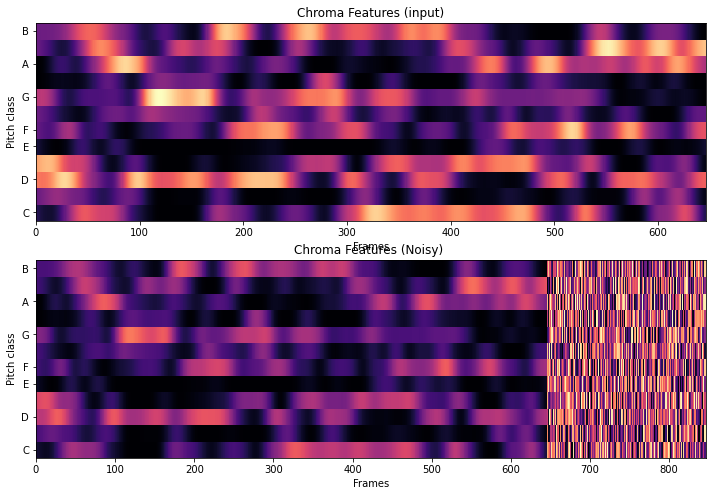

In [5]:
fig, ax = plt.subplots(nrows=2, sharex=False, figsize=(12,8))
ax[0].set(title='Chroma Features (input)')
ax[1].set(title='Chroma Features (Noisy) ')
librosa.display.specshow(X, ax=ax[0], x_axis='frames', y_axis='chroma')
librosa.display.specshow(Y, ax=ax[1], x_axis='frames', y_axis='chroma')

# Dynamic Time Warping

In [7]:
D, wp = librosa.sequence.dtw(X, Y, subseq=True)

[(0.0, 2.0), (0.0, 846.0), Text(0.5, 1.0, 'Matching cost function')]

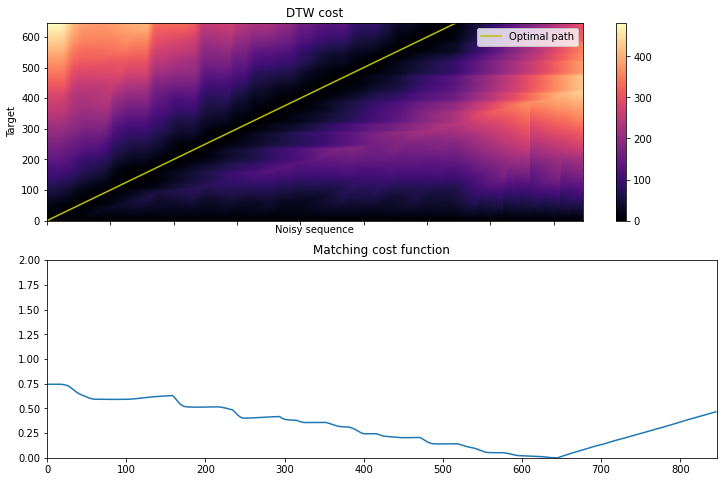

In [8]:
fig, ax = plt.subplots(nrows=2, sharex=True, figsize=(12,8))

img = librosa.display.specshow(D, x_axis='frames', y_axis='frames', ax=ax[0])

ax[0].set(title='DTW cost', xlabel='Noisy sequence', ylabel='Target')
ax[0].plot(wp[:, 1], wp[:, 0], label='Optimal path', color='y')
ax[0].legend()

fig.colorbar(img, ax=ax[0])

ax[1].plot(D[-1, :] / wp.shape[0])
ax[1].set(xlim=[0, Y.shape[1]], ylim=[0, 2], title='Matching cost function')

In [ ]:
print(wp[:,0])

[645 644 643 642 641 640 639 638 637 636 635 634 633 632 631 630 629 628
 627 626 625 624 623 622 621 620 619 618 617 616 615 614 613 612 611 610
 609 608 607 606 605 604 603 602 601 600 599 598 597 596 595 594 593 592
 591 590 589 588 587 586 585 584 583 582 581 580 579 578 577 576 575 574
 573 572 571 570 569 568 567 566 565 564 563 562 561 560 559 558 557 556
 555 554 553 552 551 550 549 548 547 546 545 544 543 542 541 540 539 538
 537 536 535 534 533 532 531 530 529 528 527 526 525 524 523 522 521 520
 519 518 517 516 515 514 513 512 511 510 509 508 507 506 505 504 503 502
 501 500 499 498 497 496 495 494 493 492 491 490 489 488 487 486 485 484
 483 482 481 480 479 478 477 476 475 474 473 472 471 470 469 468 467 466
 465 464 463 462 461 460 459 458 457 456 455 454 453 452 451 450 449 448
 447 446 445 444 443 442 441 440 439 438 437 436 435 434 433 432 431 430
 429 428 427 426 425 424 423 422 421 420 419 418 417 416 415 414 413 412
 411 410 409 408 407 406 405 404 403 402 401 400 39

In [9]:
# print(wp)
wpflip = np.flip(wp, axis=0)

In [10]:
print(wpflip)

[[  0   0]
 [  1   1]
 [  2   2]
 ...
 [643 643]
 [644 644]
 [645 645]]


# Audio to score

# Fetch a sound file

In [11]:
sound_file = urllib.request.urlretrieve("http://sporadic.stanford.edu/Chorales/mpeg/Chorale001.mp3", 'Chorale001.mp3')

In [12]:
b_audio, sr = librosa.load(sound_file[0])

/usr/local/lib/python3.7/dist-packages/librosa/core/audio.py:162: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn("PySoundFile failed. Trying audioread instead.")


In [13]:
ipd.Audio(b_audio,rate=sr)

# Fetch a kern file

In [14]:
kern_file = urllib.request.urlretrieve("https://raw.githubusercontent.com/craigsapp/bach-370-chorales/master/kern/chor001.krn", "chor001.krn")

In [15]:
!apt-get install musescore > /dev/null 2>&1
!apt-get install xvfb > /dev/null 2>&1
import os
os.putenv('DISPLAY', ':99.0')
!start-stop-daemon --start --pidfile /var/run/xvfb.pid --make-pidfile --background --exec /usr/bin/Xvfb -- :99 -screen 0 1024x768x24 -ac +extension GLX +render -noreset  > /dev/null 2>&1
from music21 import *
us = environment.UserSettings()
us['musescoreDirectPNGPath'] = '/usr/bin/mscore'
us['directoryScratch'] = '/tmp'
!sh -e /etc/init.d/x11-common start > /dev/null 2>&1

In [16]:
def sonify_kern_file(file, sr=22050):
    return np.array(
        np.sum(
            [ np.concatenate(
                [ librosa.tone(
                    librosa.midi_to_hz(p.pitch.midi),
                    duration=p.duration.quarterLength,
                    sr=sr) 
                for p in part.flat.notes
                ]) 
            for part in converter.parse(file).parts
            ],
            axis=0
            )
        )

In [17]:
kern_sonified = sonify_kern_file(kern_file[0])
ipd.Audio(kern_sonified,rate=sr)

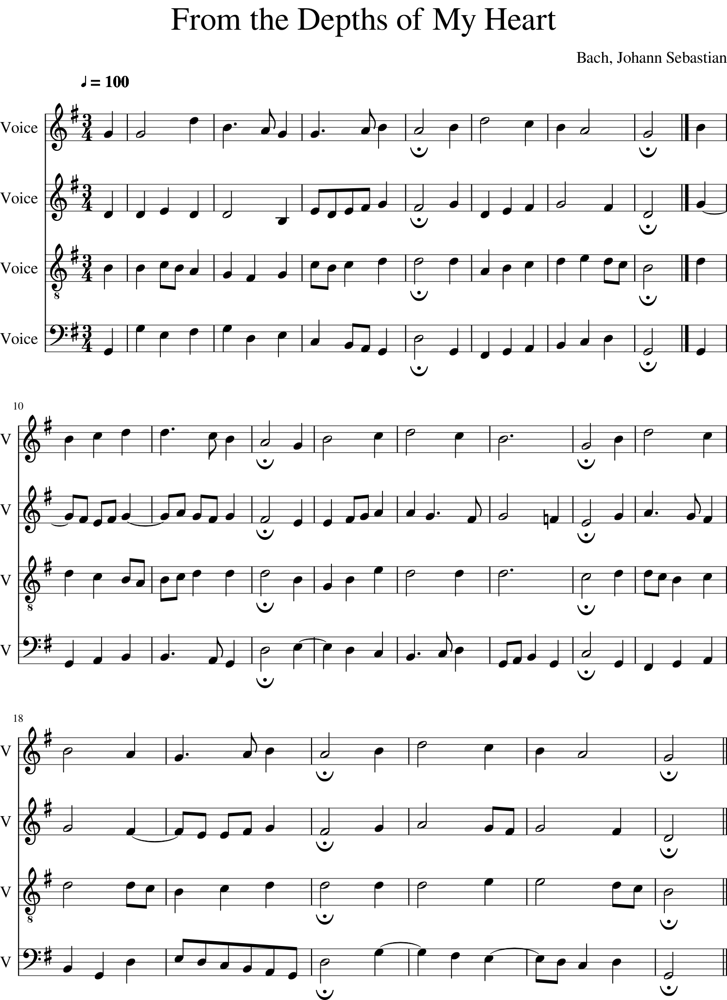

In [19]:
m = converter.parse(kern_file[0])
m.show()

In [21]:
pitches = [ [ (p.pitch.midi,p.duration.quarterLength) for p in part.flat.notes] for part in m.parts ]

In [22]:
pitches[0][0]

(67, 1.0)

In [23]:
ipd.Audio(b_audio, rate=sr)

In [25]:
def get_feats(x,y,feature, offset=0, dur=10,sr=22050):
    return  ( feature(x[offset:]), feature(y[offset:]) ) 

## Try with different features

In [26]:
feats = get_feats(kern_sonified, b_audio, 
                  librosa.feature.chroma_cens,
                #   librosa.feature.chroma_stft,
                #   librosa.feature.chroma_cqt,
                #   librosa.feature.tonnetz,
                #   librosa.feature.melspectrogram,
                #   librosa.feature.mfcc,
                #   librosa.feature.spectral_centroid,
                #   librosa.feature.spectral_contrast,
                #   librosa.feature.spectral_bandwidth,
                #   librosa.feature.spectral_flatness,
                #   librosa.feature.spectral_rolloff,
                #   librosa.feature.zero_crossing_rate,
                offset=0,dur=10,sr=sr)
b_D, b_wp = librosa.sequence.dtw(feats[0],feats[1], subseq=True)
# plt.plot(b_D[-1, :] / b_wp.shape[0])

[(0.0, 2.0), (0.0, 3900.0), Text(0.5, 1.0, 'Matching cost function')]

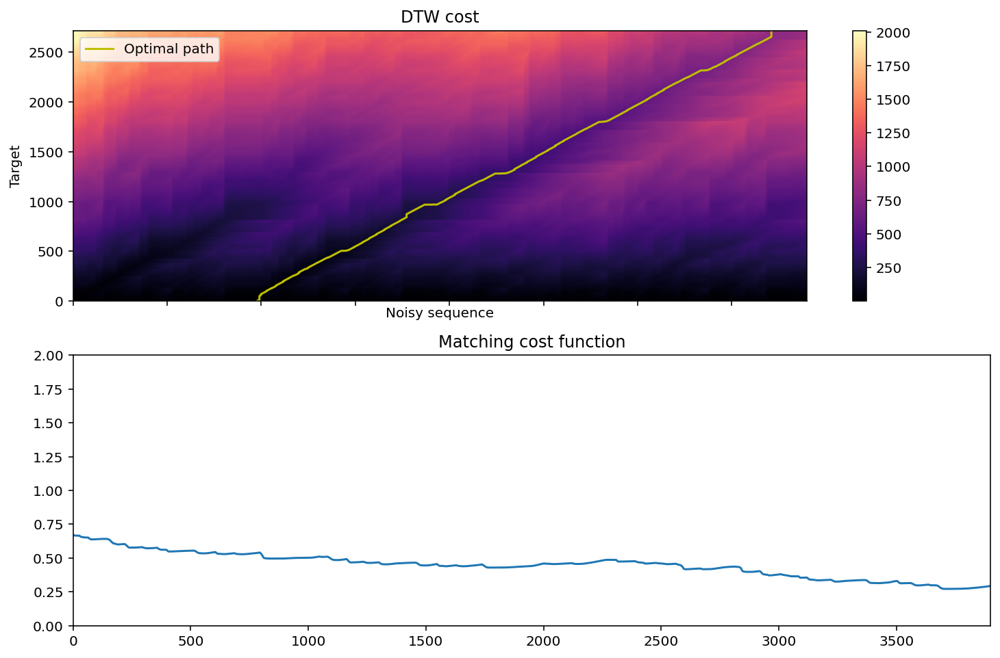

In [27]:
fig, ax = plt.subplots(nrows=2, sharex=True, figsize=(12,8))

img = librosa.display.specshow(b_D, x_axis='frames', y_axis='frames', ax=ax[0])

ax[0].set(title='DTW cost', xlabel='Noisy sequence', ylabel='Target')
ax[0].plot(b_wp[:, 1], b_wp[:, 0], label='Optimal path', color='y')
ax[0].legend()

fig.colorbar(img, ax=ax[0])

ax[1].plot(b_D[-1, :] / b_wp.shape[0])
ax[1].set(xlim=[0, feats[1].shape[1]], ylim=[0, 2], title='Matching cost function')

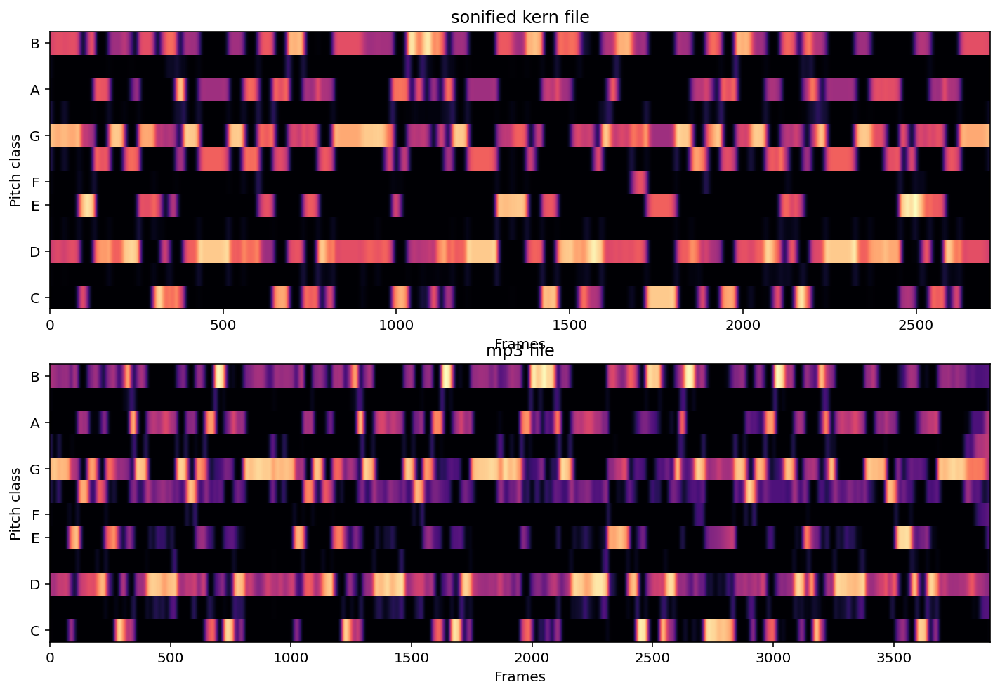

In [28]:
fig, ax = plt.subplots(nrows=2, sharex=False, figsize=(12,8))
ax[0].set(title='sonified kern file')
ax[1].set(title='mp3 file')
librosa.display.specshow(feats[0], ax=ax[0], x_axis='frames', y_axis='chroma')
librosa.display.specshow(feats[1], ax=ax[1], x_axis='frames', y_axis='chroma')

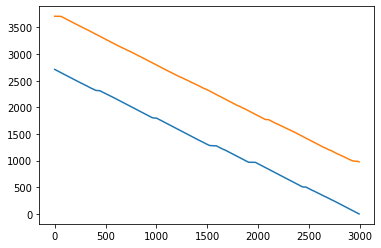

In [ ]:
plt.plot(b_wp)

# Sources

https://www.audiolabs-erlangen.de/resources/MIR/FMP/C7/C7S2_SubsequenceDTW.html

https://www.audiolabs-erlangen.de/resources/MIR/FMP/C4/C4S3_AudioThumbnailing.html

https://www.audiolabs-erlangen.de/content/05-fau/professor/00-mueller/03-publications/2007_Mueller_DTW-Chapter04-IR_Springer.pdf

https://librosa.org/doc/main/generated/librosa.sequence.dtw.html

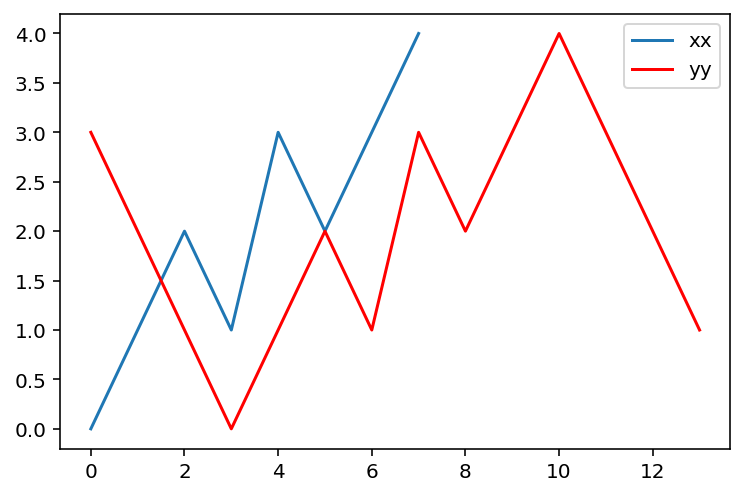

In [33]:
xx = [0, 1, 2, 1, 3, 2, 3, 4]
yy = np.concatenate([ [3, 2, 1], xx, [3, 2, 1] ])
plt.plot(xx)
plt.plot(yy, c='r') # red color
plt.legend(('xx', 'yy'))

In [34]:
# import scipy
# d = scipy.spatial.distance.euclidean(x[i-1], y[j-1])

Fill out a table with the accumulated cost (euclidean distance) between both sequences.

In [35]:
def dtw_table(x, y):
    nx = len(x)
    ny = len(y)
    table = np.zeros((nx+1, ny+1)) # pre-fill the table with zeros
    
    # Compute left column separately, i.e. j=0.
    table[1:, 0] = np.inf
        
    # Compute top row separately, i.e. i=0.
    table[0, 1:] = np.inf
        
    # Fill in the rest.
    for i in range(1, nx+1):
        for j in range(1, ny+1):
            d = np.abs(x[i-1] - y[j-1])
            table[i, j] = d + min(table[i-1, j], table[i, j-1], table[i-1, j-1])
    
    
    
    return table

In [36]:
table = dtw_table(xx,yy)
# table = dtw_table(feats[0],feats[1])

In [37]:
def dtw(x, y, table):
    i = len(x)
    j = len(y)
    path = [(i, j)]
    while i > 0 or j > 0:
        minval = np.inf
        if table[i-1, j] < minval:
            minval = table[i-1, j]
            step = (i-1, j)
        if table[i][j-1] < minval:
            minval = table[i, j-1]
            step = (i, j-1)
        if table[i-1][j-1] < minval:
            minval = table[i-1, j-1]
            step = (i-1, j-1)
        path.insert(0, step)
        i, j = step
    return np.array(path)

In [38]:
path = dtw(xx,yy, table)
# path = dtw(feats[0], feats[1], table)
# xx[path[1][0]], yy[path[1][1]]

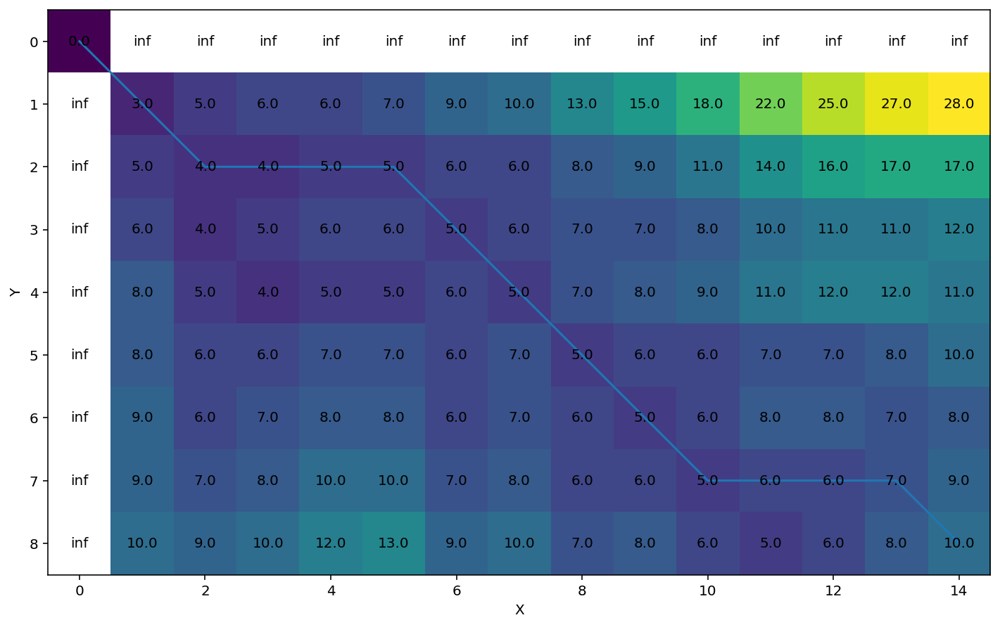

In [39]:
fig = plt.figure(figsize=(12,12))
for (j,i),label in np.ndenumerate(table):
    plt.text(i,j,label,ha='center',va='center')
plt.xlabel('X')
plt.ylabel('Y')
plt.imshow(table)
plt.plot(path[:,0])

In [40]:
Ctable, Opath = librosa.sequence.dtw(feats[0], feats[1])

In [41]:
midpont = Opath.shape[0] // 2
print(Opath[-1],Opath[midpont],Opath[0])
sKern = librosa.frames_to_samples(Opath[midpont][0])# ,hop_length=len(kern_sonified)/10/len(feats[0])) #, sr/Opath[0][1]
sMp3 =  librosa.frames_to_samples(Opath[midpont][1])# ,hop_length=len(kern_sonified)/10/len(feats[0])) #, sr/Opath[0][1]
print(sKern, sMp3)
print(len(kern_sonified))
ipd.display(ipd.Audio(kern_sonified[sKern:sKern+sr*2], rate=sr))
ipd.display(ipd.Audio(b_audio[sMp3:sMp3+sr*2], rate=sr))

[0 0] [ 975 1940] [2713 3899]
499200 993280
1389150


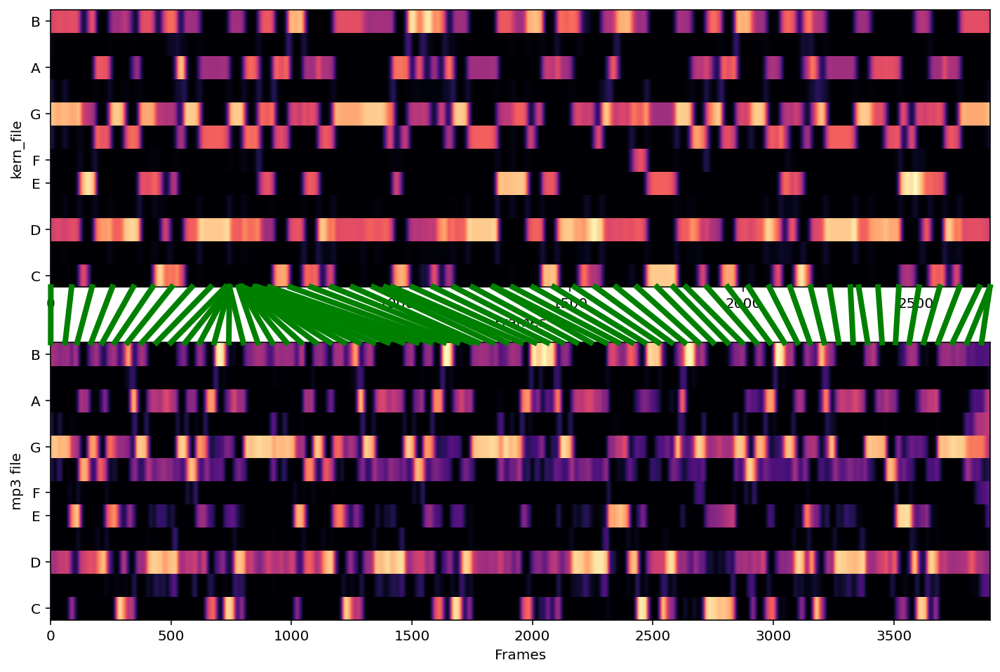

In [42]:
import matplotlib.lines as lines
fig, ax = plt.subplots(nrows=2,sharex=False, figsize=(12,8))

librosa.display.specshow(feats[0],ax=ax[0],x_axis='frames',y_axis='chroma')
librosa.display.specshow(feats[1],ax=ax[1],x_axis='frames',y_axis='chroma')
ax[0].set_ylabel('kern_file')
ax[1].set_ylabel('mp3 file')

p = np.flip(Opath)

step_size = 60

for i in range(1,len(p[:,0]),step_size):
    transFigure = fig.transFigure.inverted()

    coord_in_x = p[:,1][i]
    coord_in_y = p[:,0][i]

    coord1 = transFigure.transform(ax[0].transData.transform((coord_in_x,0)))
    coord2 = transFigure.transform(ax[1].transData.transform((coord_in_y,12)))
    # print(coord1,coord_in_x,coord2,coord_in_y)

    line = lines.Line2D(
        (coord1[0],coord2[0]),
        (coord1[1],coord2[1]),
        linewidth=4,
        color='green',
        transform=fig.transFigure)

    fig.lines.append(line)

plt.show()